# Part 1 DATA IFORMATION

In [34]:
import shutil
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import numpy as np

In [35]:
csv_file = "BostonHousing.csv"
df = pd.read_csv(csv_file)
df.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


crim: Per capita crime rate by town.


zn: Proportion of large residential lots (over 25,000 sq. ft.).


indus: Proportion of non-retail business acres per town.



Chas: Binary variable indicating if the property is near Charles River (1 for yes, 0 for no).



nox: Concentration of nitrogen oxides in the air.



rm: Average number of rooms per dwelling.



age: Proportion of old owner-occupied units built before 1940.


dis: Weighted distances to Boston employment centers.


rad: Index of accessibility to radial highways.



tax: Property tax rate per $10,000.

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   crim     506 non-null    float64
 1   zn       506 non-null    float64
 2   indus    506 non-null    float64
 3   chas     506 non-null    int64  
 4   nox      506 non-null    float64
 5   rm       501 non-null    float64
 6   age      506 non-null    float64
 7   dis      506 non-null    float64
 8   rad      506 non-null    int64  
 9   tax      506 non-null    int64  
 10  ptratio  506 non-null    float64
 11  b        506 non-null    float64
 12  lstat    506 non-null    float64
 13  medv     506 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


In [37]:
csv_file2 = "crime.csv"
df2 = pd.read_csv(csv_file2,encoding='latin-1')
df2.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [38]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 
 13  STREET               308202 non-null  object 
 14  Lat                  299074 non-null  float64
 15  Long             

Mising Value

In [39]:
missing_values_count1 = df.isnull().sum()
missing_values_count1

,0
crim,0
zn,0
indus,0
chas,0
nox,0
rm,5
age,0
dis,0
rad,0
tax,0


In [40]:
missing_values_count2 = df2.isnull().sum()
missing_values_count2

,0
INCIDENT_NUMBER,0
OFFENSE_CODE,0
OFFENSE_CODE_GROUP,0
OFFENSE_DESCRIPTION,0
DISTRICT,1765
REPORTING_AREA,0
SHOOTING,318054
OCCURRED_ON_DATE,0
YEAR,0
MONTH,0


percent_missing of BostonHousing.csv: 0.070582% 


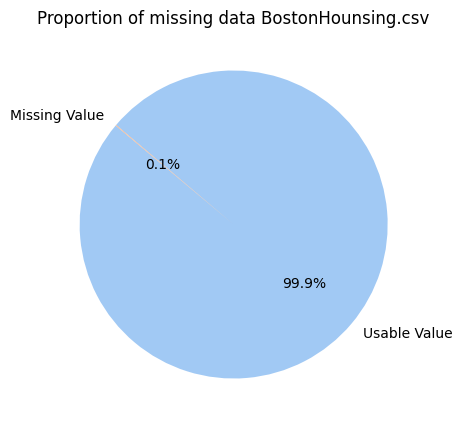

In [41]:
total_cells1 = np.prod(df.shape)
total_missing1 = missing_values_count1.sum()
percent_missing = (total_missing1/total_cells1) * 100
print("percent_missing of BostonHousing.csv: {:.6f}% ".format(percent_missing))

plt.figure(figsize=(16,5))
plt.pie([total_cells1 - total_missing1, total_missing1],
    labels=['Usable Value', 'Missing Value'],
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette("pastel")
)

plt.title("Proportion of missing data BostonHounsing.csv")
plt.show()

percent_missing of BostonHousing.csv: 6.84 %


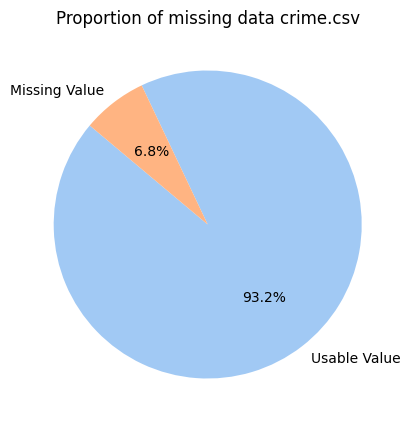

In [42]:
total_cells2 = np.prod(df2.shape)
total_missing2 = missing_values_count2.sum()
percent_missing2 = (total_missing2/total_cells2) * 100
print("percent_missing of BostonHousing.csv: {:.2f} %".format(percent_missing2))

plt.figure(figsize=(16,5))
plt.pie([total_cells2 - total_missing2, total_missing2],
    labels=['Usable Value', 'Missing Value'],
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette("pastel")
)

plt.title("Proportion of missing data crime.csv")
plt.show()

# Part 2  Data Analysis

In [43]:
mean_of_crime = np.mean(df['crim'])
print("The average crime rate of each city is {:.2f}".format(mean_of_crime))

The average crime rate of each city is 3.61


In [44]:
min_of_crime = np.min(df['crim'])
print("The minimum crime rate of each city is {:.2f}".format(min_of_crime))
df[df['crim'] == min_of_crime]

The minimum crime rate of each city is 0.01


,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.09,1,296,15.3,396.9,4.98,24.0


In [45]:
max_of_crime = np.max(df['crim'])
print("The maximum crime rate of each city is {:.2f}".format(max_of_crime))
df[df['crim'] == max_of_crime]

The maximum crime rate of each city is 88.98


,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
380,88.9762,0.0,18.1,0,0.671,6.968,91.9,1.4165,24,666,20.2,396.9,17.21,10.4


 The 10 Most Crime-Happening Streets in Boston

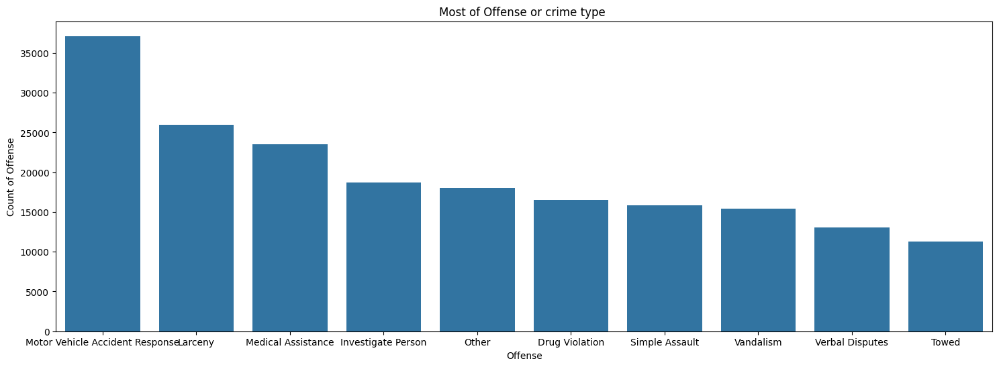

In [46]:
offense_codes_group_sorted = df2["OFFENSE_CODE_GROUP"].value_counts()
plt.figure(figsize=(18,6))
plt.title("Most of Offense or crime type ")
sns.barplot(offense_codes_group_sorted[:10,])
plt.ylabel("Count of Offense")
plt.xlabel("Offense")
plt.show()



> Displaying the frequency of crime types in Boston, divided into three categories as follows:
>
> **1. UCR Part I**
> Meaning: Comprises highly violent crimes considered major offenses that impact public safety.
> Types of crimes:
>
> * Murder
> * Rape
> * Robbery
> * Burglary
> * Theft
> * Aggravated Assault
> * Arson
>
> **2. UCR Part II**
> Meaning: Consists of less violent crimes but still impactful to society.
> Types of crimes:
>
> * Driving Under the Influence
> * Drug Offenses
> * Disorderly Conduct
> * Sex Offenses
> * Simple Assault
>
> **3. UCR Part III**
> Meaning: Includes crimes and offenses not covered in Part I and Part II, which may be more diverse.
> Types of crimes:
>
> * Fraud
> * Vandalism
> * Simple Assault
> * Economic crimes, such as Forgery


Which UCR\_PART occurs most frequently in the city of Boston?


Text(0.5, 1.0, 'Frequency UCR_PART in Boston city')

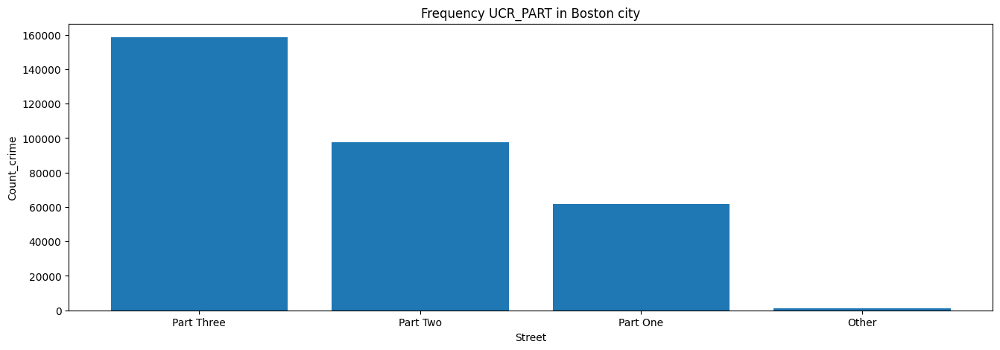

In [47]:
ucr_count = df2['UCR_PART'].value_counts().reset_index()
ucr_count.columns = ['UCR_PART', 'Count']
plt.figure(figsize=(16,5), dpi=100)
plt.bar(ucr_count['UCR_PART'], ucr_count['Count'])
plt.xlabel('Street')
plt.ylabel('Count_crime')
plt.title('Frequency UCR_PART in Boston city')

Top 10 cities with the highest occurrence of UCR in each PART

In [48]:
ucr1 = df2[df2['UCR_PART'] == "Part One"]
street_ucr1_count = ucr1["STREET"].value_counts()

ucr2 = df2[df2['UCR_PART'] == "Part Two"]
street_ucr2_count = ucr2["STREET"].value_counts()

ucr3 = df2[df2['UCR_PART'] == "Part Three"]
street_ucr3_count = ucr3["STREET"].value_counts()

df_ucr1 = street_ucr1_count.head(10).reset_index()
df_ucr2 = street_ucr2_count.head(10).reset_index()
df_ucr3 = street_ucr3_count.head(10).reset_index()

df_ucr1.columns = ['STREET_UCR1', 'COUNT_UCR1']
df_ucr2.columns = ['STREET_UCR2', 'COUNT_UCR2']
df_ucr3.columns = ['STREET_UCR3', 'COUNT_UCR3']

df_compare = pd.concat([df_ucr1, df_ucr2, df_ucr3], axis=1)

df_compare


,STREET_UCR1,COUNT_UCR1,STREET_UCR2,COUNT_UCR2,STREET_UCR3,COUNT_UCR3
0,WASHINGTON ST,3190,WASHINGTON ST,4994,WASHINGTON ST,5979
1,BOYLSTON ST,2737,BLUE HILL AVE,2745,BLUE HILL AVE,3647
2,BLUE HILL AVE,1371,BOYLSTON ST,2114,DORCHESTER AVE,2404
3,HUNTINGTON AVE,1123,HARRISON AVE,1851,BOYLSTON ST,2357
4,TREMONT ST,1092,DORCHESTER AVE,1730,COMMONWEALTH AVE,2236
5,MASSACHUSETTS AVE,1089,TREMONT ST,1610,CENTRE ST,2226
6,NEWBURY ST,1038,MASSACHUSETTS AVE,1569,TREMONT ST,2086
7,DORCHESTER AVE,994,CENTRE ST,1398,MASSACHUSETTS AVE,2029
8,COMMONWEALTH AVE,938,HYDE PARK AVE,1035,HYDE PARK AVE,1986
9,HARRISON AVE,844,COLUMBIA RD,1030,HARRISON AVE,1907


In [49]:
# Plot Heat Map for OFFENSE_CODE_GROUP
from folium.plugins import HeatMap
df_crime_geo = df2[['Lat', 'Long']].dropna()
boston_map = folium.Map(location=[42.3601, -71.0589], zoom_start=12)
HeatMap(data=df_crime_geo[['Lat', 'Long']].values, radius=10).add_to(boston_map)
boston_map
# figure in figure/figure1.i

In which area of Boston do most Larceny?

In [50]:
crime_type = "Larceny"
df_crime = df2[df2['OFFENSE_CODE_GROUP'] == crime_type]
df_crime_geo = df_crime[['Lat', 'Long']].dropna()
boston_map = folium.Map(location=[42.3601, -71.0589], zoom_start=12)
HeatMap(data=df_crime_geo[['Lat', 'Long']].values, radius=10).add_to(boston_map)
boston_map

How many streets are there in Boston?

In [51]:
st = df2['STREET'].drop_duplicates()
print("์Number of street in Bostin is {} ".format(len(st)))
st

์Number of street in Bostin is 4658 


,STREET
0,LINCOLN ST
1,HECLA ST
2,CAZENOVE ST
3,NEWCOMB ST
4,DELHI ST
...,...
318337,HAMILTON
318564,FINANCIAL CTR
318601,NEWCOMB
318877,MT PLEASANT AVE


What crimes are most common on LINCOLN STREET?

In [52]:
lincoln_street = df2[df2['STREET'] == 'LINCOLN ST']
lincoln_street_count = lincoln_street['OFFENSE_CODE_GROUP'].value_counts().reset_index()
lincoln_street_count.columns = ['OFFENSE_CODE_GROUP', 'COUNT']
lincoln_street_count.head(10)

,OFFENSE_CODE_GROUP,COUNT
0,Motor Vehicle Accident Response,45
1,Vandalism,41
2,Larceny,38
3,Larceny From Motor Vehicle,33
4,Investigate Person,28
5,Other,26
6,Simple Assault,20
7,Medical Assistance,20
8,Drug Violation,17
9,Aggravated Assault,14


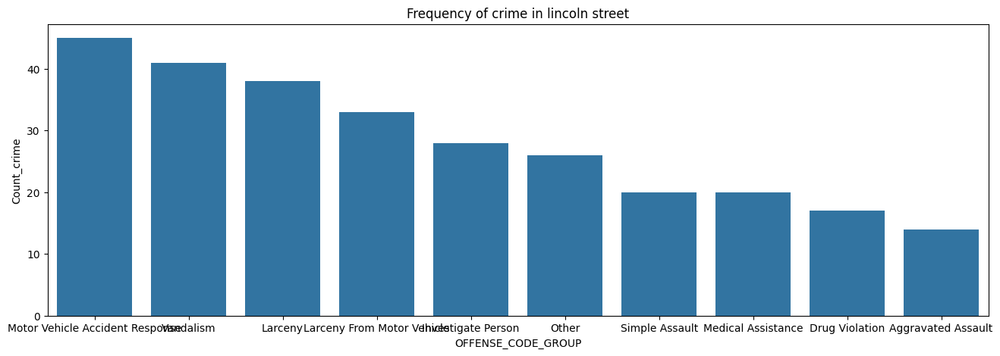

In [53]:
plt.figure(figsize=(16,5), dpi=100)
sns.barplot(data = lincoln_street_count[:10], x = "OFFENSE_CODE_GROUP", y = "COUNT")
plt.xlabel('OFFENSE_CODE_GROUP')
plt.ylabel('Count_crime')
plt.title('Frequency of crime in lincoln street')
plt.show()

Which day and time have the highest crime occurrence?

In [54]:
#นับจำนวนครั้งที่เกิดอาชญากรรมในชั่วโมงต่าง ๆ
HOUR_counts = df2['HOUR'].value_counts().reset_index()
HOUR_counts.columns = ['HOUR', 'COUNT']
HOUR_counts['HOUR'] = HOUR_counts['HOUR'].astype(int)
HOUR_counts.sort_values("HOUR")

,HOUR,COUNT
11,0,15106
17,1,9269
19,2,7693
21,3,4589
22,4,3408
23,5,3311
20,6,5026
18,7,8850
14,8,13043
12,9,14740


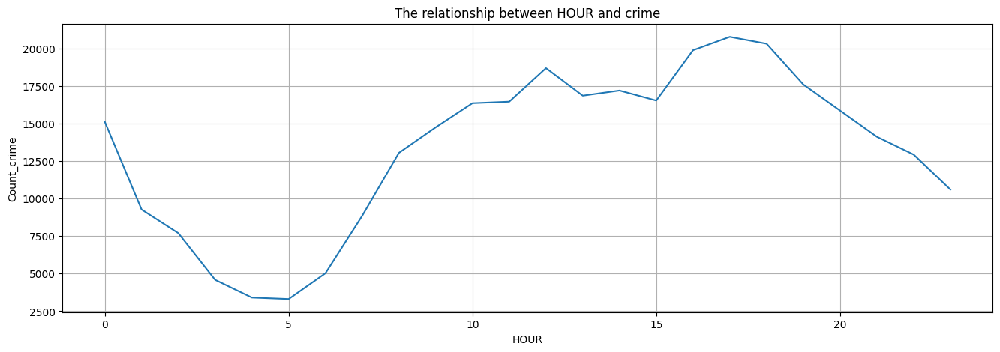

In [55]:
plt.figure(figsize=(16,5), dpi=100)
sns.lineplot(data=HOUR_counts, x="HOUR", y="COUNT")
plt.xlabel('HOUR')
plt.ylabel('Count_crime')
plt.title('The relationship between HOUR and crime')
plt.grid()
plt.show()

rom the visualization of the relationship between time and crime rate, it can be observed that the crime rate noticeably increases after noon.

In [56]:
day_counts_df = df2["DAY_OF_WEEK"].value_counts().reset_index()
day_counts_df.columns = ['DAY_OF_WEEK', 'COUNT']
day_counts_df

,DAY_OF_WEEK,COUNT
0,Friday,48495
1,Wednesday,46729
2,Thursday,46656
3,Tuesday,46383
4,Monday,45679
5,Saturday,44818
6,Sunday,40313


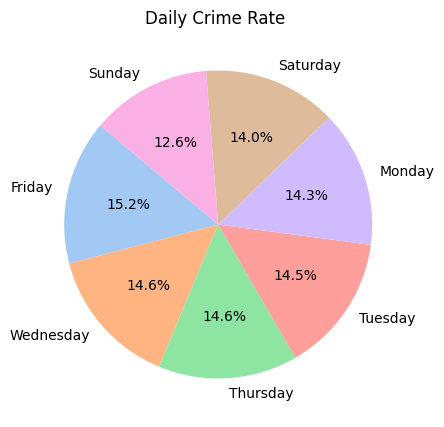

In [57]:
plt.figure(figsize=(16,5))
plt.pie(day_counts_df['COUNT'],
    labels=day_counts_df["DAY_OF_WEEK"],
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette("pastel")
)

plt.title("Daily Crime Rate ")
plt.show()

เวลาและวันในวันที่เกิดเหตุใดเกิดเหตุอาชฐากรรมบ่อยที่สุด ?

/tmp/ipython-input-58-3124934870.py:7: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = day_freq.pivot_table(index='DAY_OF_WEEK', columns='HOUR', values='Count', fill_value=0)


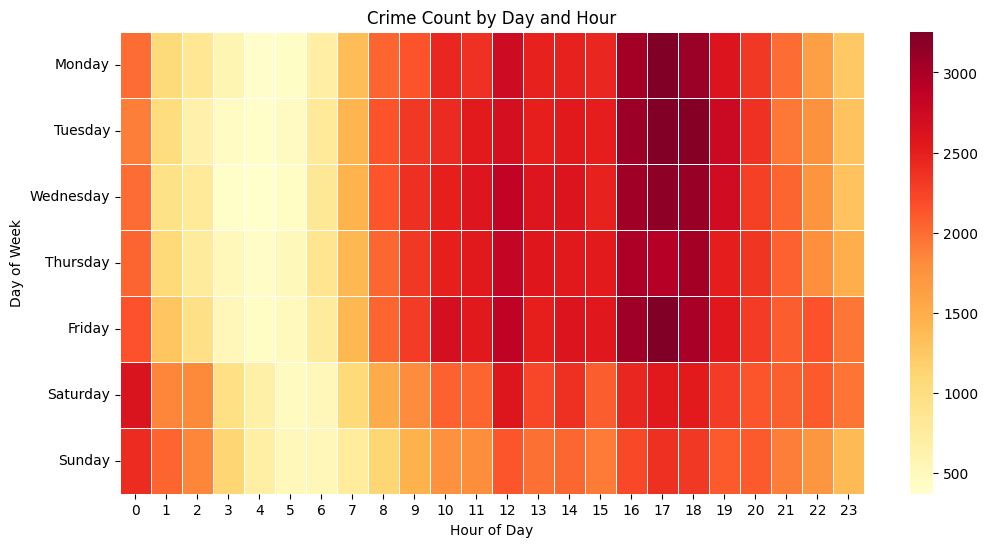

In [58]:
day_freq = df2[['DAY_OF_WEEK', 'HOUR']].value_counts().reset_index()
day_freq.columns = ['DAY_OF_WEEK', 'HOUR', 'Count']
day_freq['HOUR'] = day_freq['HOUR'].astype(int)
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_freq['DAY_OF_WEEK'] = pd.Categorical(day_freq['DAY_OF_WEEK'], categories=day_order, ordered=True)

pivot_table = day_freq.pivot_table(index='DAY_OF_WEEK', columns='HOUR', values='Count', fill_value=0)
plt.figure(figsize=(12,6))
sns.heatmap(pivot_table, cmap="YlOrRd", linewidths=0.5)
plt.title("Crime Count by Day and Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Day of Week")
plt.show()


From the scatter plot and heatmap, it is noticeable that crime rates start to increase from 10 AM onwards.


What factors are related to the occurrence of crime in the city of Boston?


In [59]:
crim_corr = df.corr()["crim"]
crim_corr.sort_values(ascending=False)

,crim
crim,1.000000
rad,0.625505
tax,0.582764
lstat,0.455621
nox,0.420972
indus,0.406583
age,0.352734
ptratio,0.289946
chas,-0.055892
zn,-0.200469


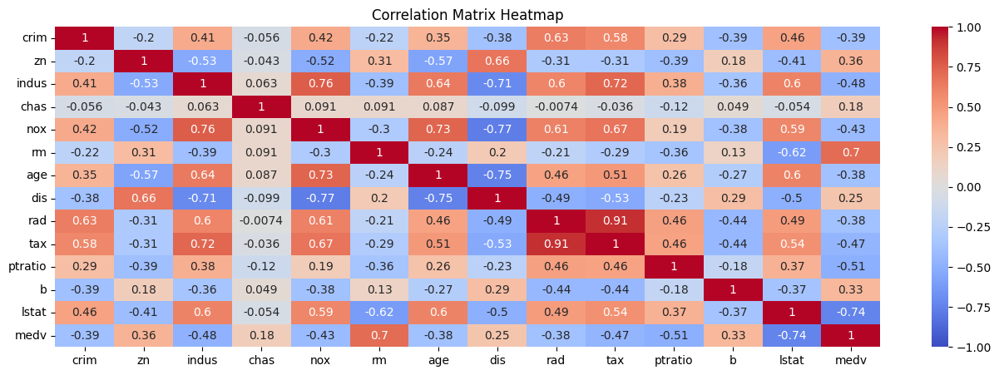

In [60]:
import seaborn as sns
correlation_matrix = df.corr()
plt.figure(figsize=(16, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()

Areas with high crime rates (crim) tend to be near main roads (rad), in industrial zones with high pollution, poor communities, old buildings, low house prices, far from good residential zones, and distant from natural areas. Areas with low crime rates (crim) usually have large houses, high house prices, stable communities, and are far from industrial zones.


แสดงความสัมพันธ์ระหว่างระยาทางที่ใกล้กับถนนสายหลัก กับ อัตราการก่ออาชญากรรม

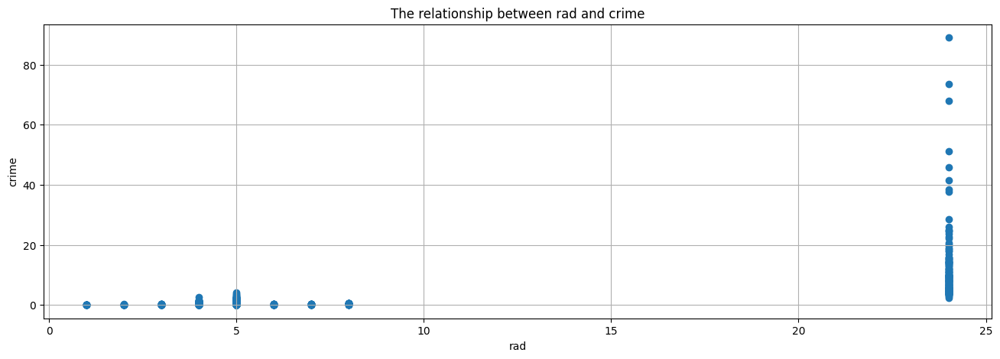

In [61]:
plt.figure(figsize=(16,5), dpi=100)
plt.scatter(df['rad'], df['crim'])
plt.title('The relationship between rad and crime')
plt.xlabel('rad')
plt.ylabel('crime')
plt.grid()
plt.show()

Many cities with greater distances between the city center and main roads tend to have higher crime rates.


Show the relationship between the tax rate and the crime rate.


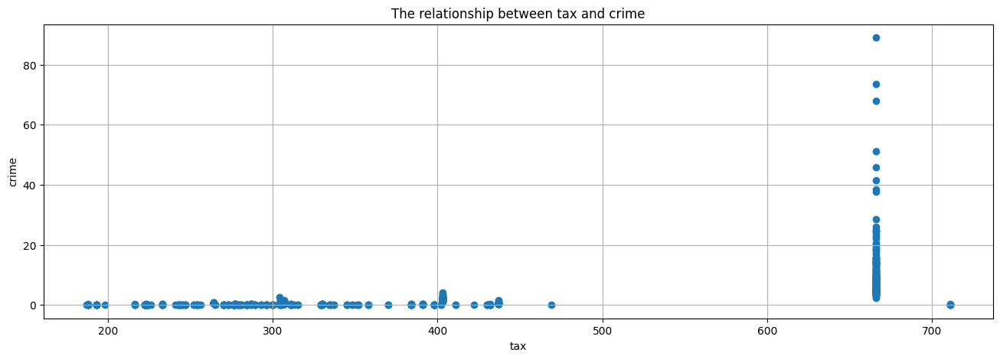

In [62]:
plt.figure(figsize=(16,5), dpi=100)
plt.scatter(df['tax'], df['crim'])
plt.title('The relationship between tax and crime')
plt.xlabel('tax')
plt.ylabel('crime')
plt.grid()
plt.show()

Many cities with high tax rates also tend to have higher crime rates.


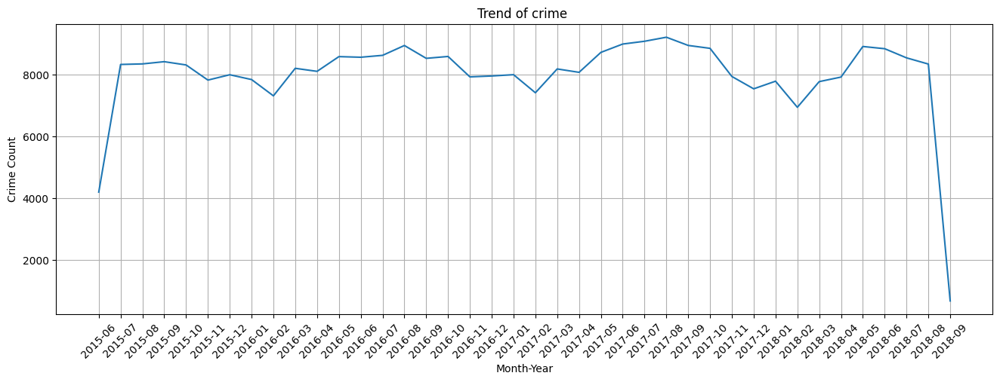

In [63]:
dy = pd.to_datetime(df2['OCCURRED_ON_DATE']).reset_index()

dy_counts = (dy['OCCURRED_ON_DATE'].dt.to_period('M').value_counts().reset_index())

dy_counts.columns = ['month_year', 'Count']

dy_counts = dy_counts.sort_values('month_year')
dy_counts['month_year'] = dy_counts['month_year'].astype(str)

plt.figure(figsize=(16,5), dpi=100)
sns.lineplot(data=dy_counts, x='month_year', y='Count')
plt.xlabel('Month-Year')
plt.ylabel('Crime Count')
plt.title('Trend of crime ')
plt.xticks(rotation=45)
plt.grid()
plt.show()

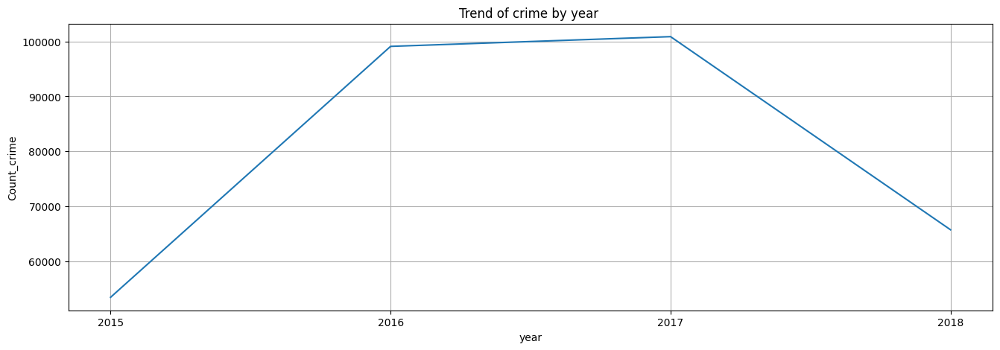

In [64]:
y_counts = dy['OCCURRED_ON_DATE'].dt.to_period('Y').value_counts().reset_index()
y_counts.columns = ['year', 'Count']
y_counts['month_year'] = y_counts['year'].astype(str)
y_counts = y_counts.sort_values('year',ascending=True)
plt.figure(figsize=(16,5), dpi=100)
sns.lineplot(data = y_counts, x = "month_year", y = "Count")
plt.xlabel('year')
plt.ylabel('Count_crime')
plt.title('Trend of crime by year ')
plt.grid()
plt.show()